# **OFA**
Start to enjoy image captioning with OFA! 

In [6]:
%matplotlib inline

In [8]:
# clone OFA if there does not exist the repo
%cd /content
%rm -rf OFA
! git clone https://github.com/OFA-Sys/OFA.git

/content
Cloning into 'OFA'...
remote: Enumerating objects: 6095, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (110/110), done.
remote: Total 6095 (delta 60), reused 63 (delta 23), pack-reused 5960
Receiving objects: 100% (6095/6095), 122.11 MiB | 17.06 MiB/s, done.
Resolving deltas: 100% (2328/2328), done.


## **Download Checkpoint**
We provide a link for our public checkpoint, and you only need to wget it to your workspace. We also provide an alternative below. Choose one as you like!

In [10]:
%cd /content
! mkdir -p /content/OFA/checkpoints/
# ! wget https://ofa-silicon.oss-us-west-1.aliyuncs.com/checkpoints/caption_large_best_clean.pt
# ! mv caption_large_best_clean.pt OFA/checkpoints/caption.pt

/content


In [11]:
! wget https://ofa-silicon.oss-us-west-1.aliyuncs.com/checkpoints/caption_large_best_clean.pt

--2022-08-16 19:40:16--  https://ofa-silicon.oss-us-west-1.aliyuncs.com/checkpoints/caption_large_best_clean.pt
Resolving ofa-silicon.oss-us-west-1.aliyuncs.com (ofa-silicon.oss-us-west-1.aliyuncs.com)... 47.88.111.45
Connecting to ofa-silicon.oss-us-west-1.aliyuncs.com (ofa-silicon.oss-us-west-1.aliyuncs.com)|47.88.111.45|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5717992325 (5.3G) [application/octet-stream]
Saving to: ‘caption_large_best_clean.pt’

caption_large_best_ 100%[===================>]   5.33G  13.2MB/s    in 7m 5s   

2022-08-16 19:47:22 (12.8 MB/s) - ‘caption_large_best_clean.pt’ saved [5717992325/5717992325]



BTW, if you cannot endure downloading (which might be slow if there are too many people downloading our checkpoint at the same time), we provide an alternative with Google Drive. 

First you need to manually put the checkpoint on your Google Drive by clicking the [URL](https://drive.google.com/file/d/1WBQl0WlzvdctslJyLNgedYpRrWAZC69X/view?usp=sharing) and clicking the bottom on the top right. 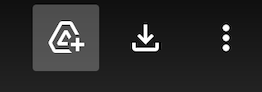

Then you just need to run the codes below without waiting:)

In [ ]:
# from google.colab import drive
# drive.mount('/content/Drive')
# ! mkdir -p /content/OFA/checkpoints
# ! ln -s /content/Drive/MyDrive/caption.pt /content/OFA/checkpoints/caption.pt

Drive already mounted at /content/Drive; to attempt to forcibly remount, call drive.mount("/content/Drive", force_remount=True).


## **Install Fairseq**
We advise you to install fairseq by cloning the official repository and running "pip install". 

You should restart the window if you meet the hint of "RESTART RUNTIME". 

In [13]:
# clone Fairseq for installation
%cd /content
! git clone https://github.com/pytorch/fairseq.git
%cd /content/fairseq
! pip install --use-feature=in-tree-build ./

/content
Cloning into 'fairseq'...
remote: Enumerating objects: 32167, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 32167 (delta 11), reused 6 (delta 1), pack-reused 32129
Receiving objects: 100% (32167/32167), 22.53 MiB | 17.15 MiB/s, done.
Resolving deltas: 100% (23557/23557), done.
/content/fairseq
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/fairseq
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 116 kB 27.3 MB/s 
     |████████████████████████████████| 235 kB 67.5 MB/s 
     |████████████████████████████████| 123 kB 66.9 MB/s 
     |████████████████████████████████| 112 kB 69.0 MB/s 
     |████████████████████████████████| 596 kB 64.0 MB/s 
  Created wheel for fairseq: filename=fai

## **Preparation**
Below you just need to import required packages, and check whether to use GPU or FP16. 

In [15]:
%cd /content/OFA
! sed '1d' requirements.txt | xargs -I {} pip install {}

/content/OFA
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 509 kB 26.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 2.8 MB/s 
  Created wheel for ftfy: filename=ftfy-6.0.3-py3-none-any.whl size=41933 sha256=a587cfcc5efc9bef20bdfff0f26f049bb1474cd6cba0dba9763bc8acd11298b6
  Stored in directory: /root/.cache/pip/wheels/19/f5/38/273eb3b5e76dfd850619312f693716ac4518b498f5ffb6f56d
Successfully built ftfy
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 124 kB 29.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple

In [16]:
import torch
import numpy as np
from fairseq import utils,tasks
from fairseq import checkpoint_utils
from utils.eval_utils import eval_step
from tasks.mm_tasks.caption import CaptionTask
from models.ofa import OFAModel
from PIL import Image

# Register caption task
tasks.register_task('caption',CaptionTask)

# turn on cuda if GPU is available
use_cuda = torch.cuda.is_available()
# use fp16 only when GPU is available
use_fp16 = False

## **Build Model**
Below you can build your model and load the weights from the given checkpoint, and also build a generator. 

In [18]:
# Load pretrained ckpt & config
overrides={"bpe_dir":"utils/BPE", "eval_cider":False, "beam":5, "max_len_b":16, "no_repeat_ngram_size":3, "seed":7}
models, cfg, task = checkpoint_utils.load_model_ensemble_and_task(
        utils.split_paths('checkpoints/caption_large_best_clean.pt'),
        arg_overrides=overrides
    )

# Move models to GPU
for model in models:
    model.eval()
    if use_fp16:
        model.half()
    if use_cuda and not cfg.distributed_training.pipeline_model_parallel:
        model.cuda()
    model.prepare_for_inference_(cfg)

# Initialize generator
generator = task.build_generator(models, cfg.generation)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
#jit_model = torch.jit.script(model)
#torch.__version__
#torch.jit.save(jit_model, 'OFA_jit.pt')
#type(jit_model)

## **Preprocess**
We demonstrate the required transformation functions for preprocessing inputs.

In [19]:
# Image transform
from torchvision import transforms
mean = [0.5, 0.5, 0.5]
std = [0.5, 0.5, 0.5]

patch_resize_transform = transforms.Compose([
    lambda image: image.convert("RGB"),
    transforms.Resize((cfg.task.patch_image_size, cfg.task.patch_image_size), interpolation=Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Text preprocess
bos_item = torch.LongTensor([task.src_dict.bos()])
eos_item = torch.LongTensor([task.src_dict.eos()])
pad_idx = task.src_dict.pad()

def encode_text(text, length=None, append_bos=False, append_eos=False):
    s = task.tgt_dict.encode_line(
        line=task.bpe.encode(text),
        add_if_not_exist=False,
        append_eos=False
    ).long()
    if length is not None:
        s = s[:length]
    if append_bos:
        s = torch.cat([bos_item, s])
    if append_eos:
        s = torch.cat([s, eos_item])
    return s

# Construct input for caption task
def construct_sample(image: Image):
    patch_image = patch_resize_transform(image).unsqueeze(0)
    patch_mask = torch.tensor([True])
    src_text = encode_text(" what does the image describe?", append_bos=True, append_eos=True).unsqueeze(0)
    src_length = torch.LongTensor([s.ne(pad_idx).long().sum() for s in src_text])
    sample = {
        "id":np.array(['42']),
        "net_input": {
            "src_tokens": src_text,
            "src_lengths": src_length,
            "patch_images": patch_image,
            "patch_masks": patch_mask
        }
    }
    return sample
  
# Function to turn FP32 to FP16
def apply_half(t):
    if t.dtype is torch.float32:
        return t.to(dtype=torch.half)
    return t

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


## **Run Inference**
Download an image and run the following scripts to generate the caption.

In [31]:
def translate(txt):
  my_id = 'CNxoBOPuk1U982ZKsFpA'
  my_key = 'agx92UyjwO'
  endpoint = 'https://openapi.naver.com/v1/papago/n2mt'

  s = 'en'
  t = 'ko'

  import urllib

  txt = urllib.parse.quote(txt) # txt 한국어 못들어감 -> 변경

  param = 'source='+s+'&target='+t+'&text='+txt

  res = urllib.request.Request(endpoint)
  res.add_header('X-Naver-Client-Id',my_id)
  res.add_header('X-Naver-Client-Secret',my_key)
  response = urllib.request.urlopen(res, data=param.encode('utf-8'))

  import json
  results = json.load(response)

  print(results.get('message').get('result').get('translatedText'))

In [78]:
# Download an image from COCO or you can use other images with wget
# ! wget http://farm4.staticflickr.com/3539/3836680545_2ccb331621_z.jpg 
# ! mv 3836680545_2ccb331621_z.jpg  test.jpg
image = Image.open('./test2.jpg')

# Construct input sample & preprocess for GPU if cuda available
sample = construct_sample(image)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

In [80]:
import warnings
warnings.filterwarnings('ignore')

In [81]:
# Run eval step for caption
with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

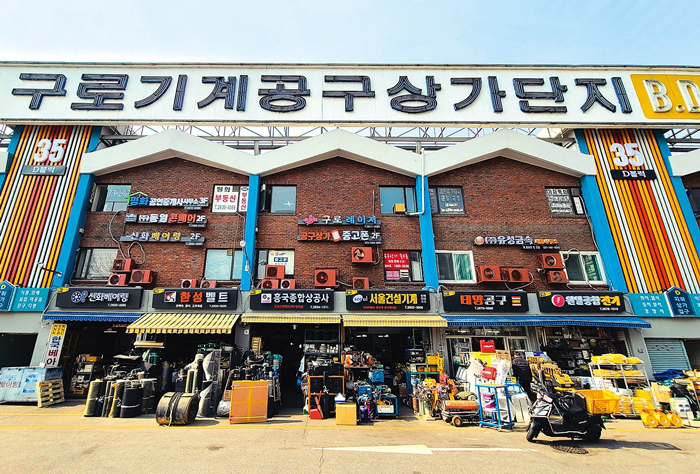

Caption: a building with a lot of luggage in front of it
앞에 짐이 많은 건물


In [82]:
display(image2)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

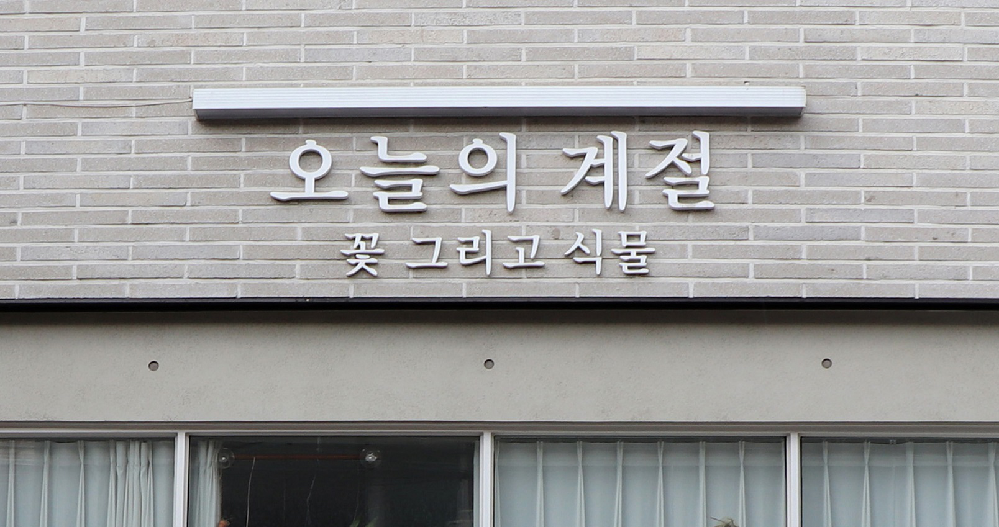

Caption: a white brick building with japanese writing on it
일본어가 적힌 하얀 벽돌 건물


In [83]:
image3 = Image.open('./test3.jpg')

sample = construct_sample(image3)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image3)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

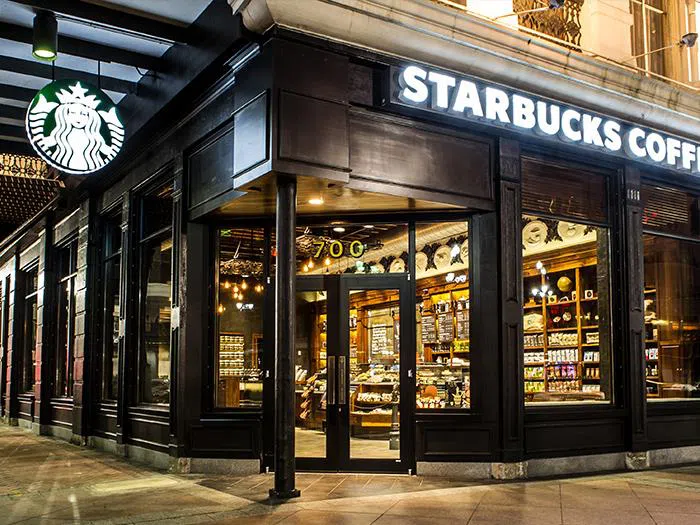

Caption: a starbucks coffee shop on a city street at night
도시의 밤거리에 있는 스타벅스 커피숍


In [84]:
image4 = Image.open('./test4.jpg')

sample = construct_sample(image4)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image4)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

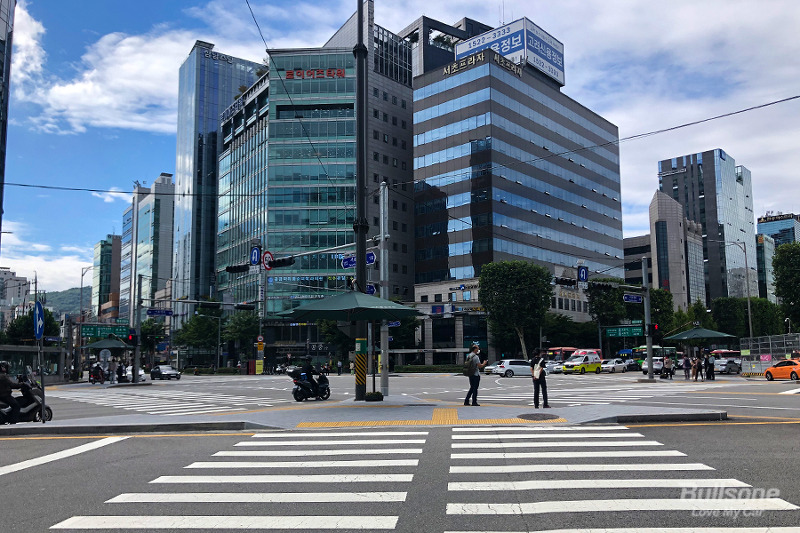

Caption: a busy intersection in a city with tall buildings
높은 빌딩이 있는 도시의 번화한 교차로


In [85]:
image5 = Image.open('./test5.jpg')

sample = construct_sample(image5)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image5)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

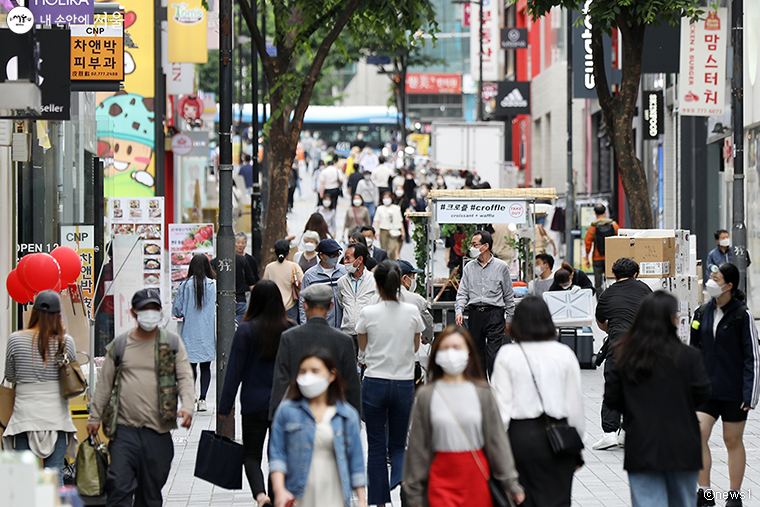

Caption: people wearing masks walk down a busy city street
마스크를 쓴 사람들은 번화한 도시 거리를 걷는다.


In [86]:
image6 = Image.open('./test6.jpg')

sample = construct_sample(image6)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image6)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

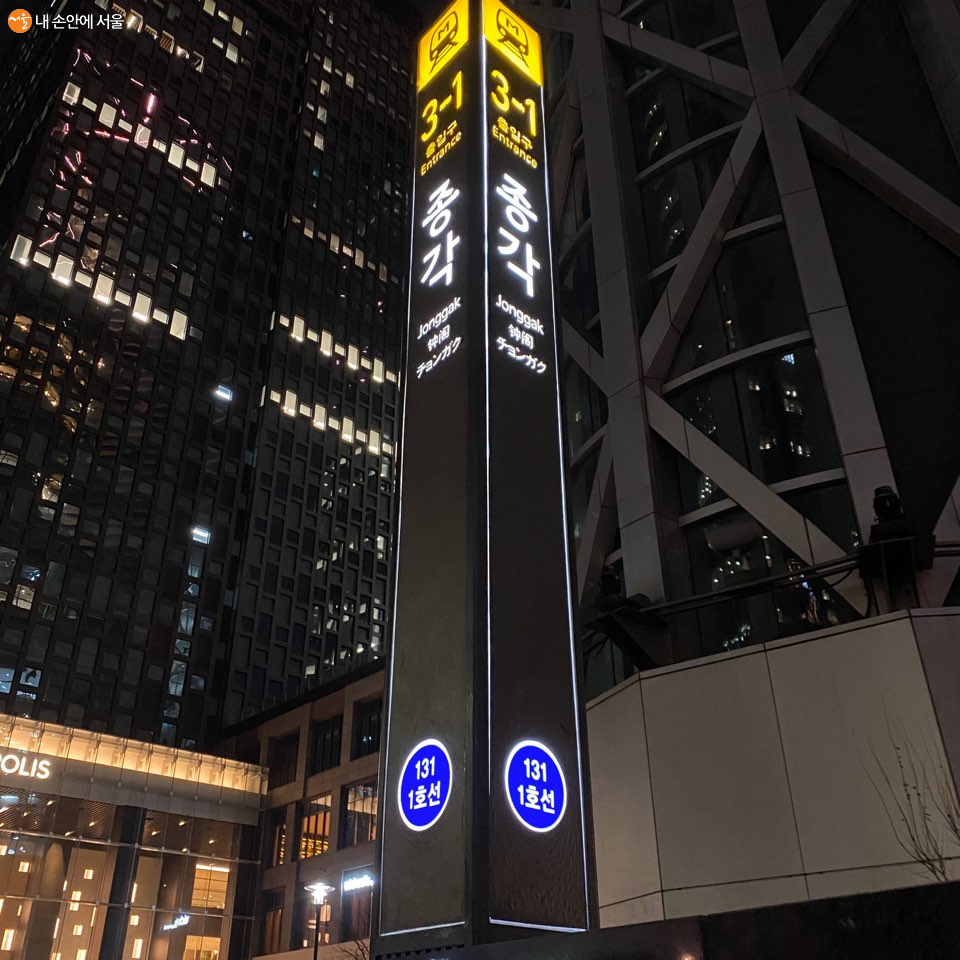

Caption: a sign in front of a tall building at night
밤에 높은 건물 앞에 있는 표지판


In [87]:
image7 = Image.open('./test7.jpg')

sample = construct_sample(image7)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image7)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

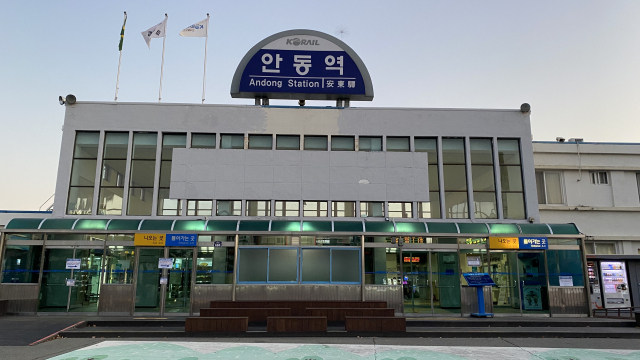

Caption: the front of a building with a sign on top of it
그 위에 간판이 있는 건물의 정면


In [88]:
image8 = Image.open('./test8.jpg')

sample = construct_sample(image8)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image8)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

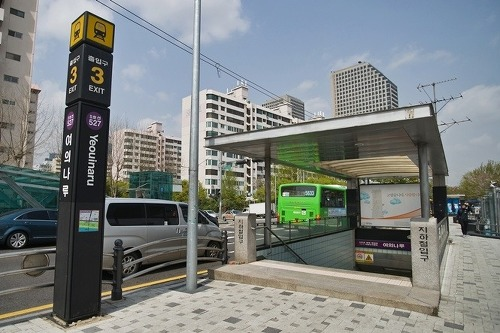

Caption: a gas station in a city with cars and buses
자동차와 버스가 있는 도시의 주유소


In [89]:
image9 = Image.open('./test9.jpg')

sample = construct_sample(image9)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image9)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

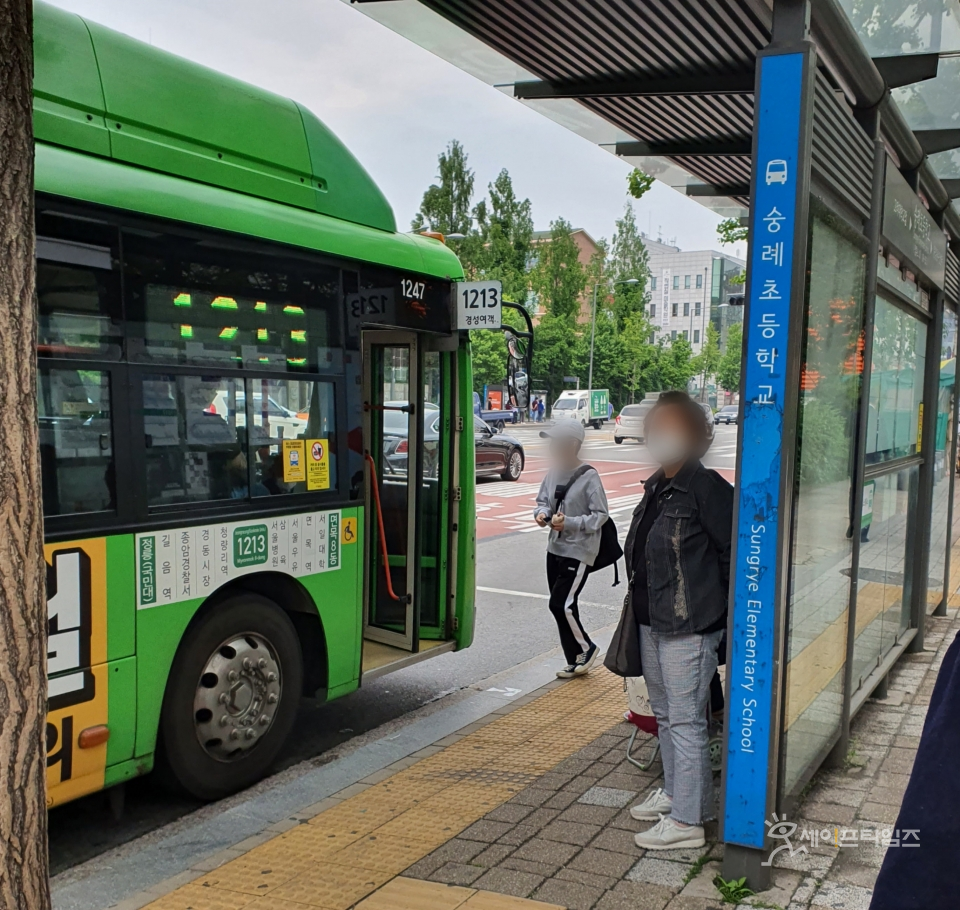

Caption: people waiting at a bus stop to get on a green bus
녹색 버스를 타기 위해 버스 정류장에서 기다리는 사람들


In [90]:
image10 = Image.open('./test10.jpg')

sample = construct_sample(image10)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image10)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

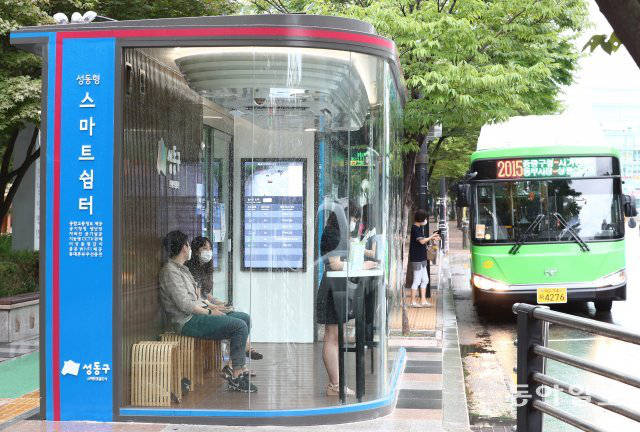

Caption: people sitting at a bus stop
버스 정류장에 앉아 있는 사람들


In [91]:
image11 = Image.open('./test11.jpg')

sample = construct_sample(image11)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image11)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

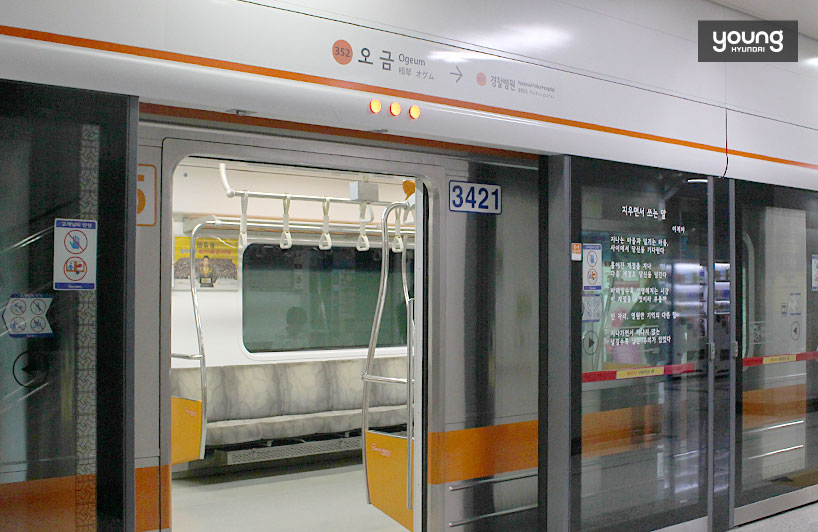

Caption: the door of a subway train with its door open
문이 열린 지하철의 문


In [92]:
image12 = Image.open('./test12.jpg')

sample = construct_sample(image12)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image12)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

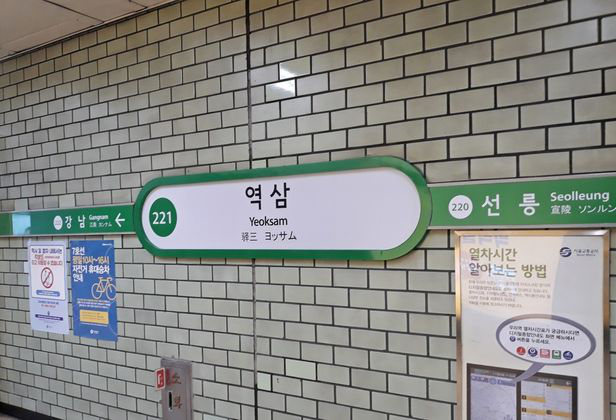

Caption: a white and green sign on a subway wall
지하철 벽의 흰색과 녹색 표지판


In [93]:
image13 = Image.open('./test13.jpg')

sample = construct_sample(image13)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image13)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

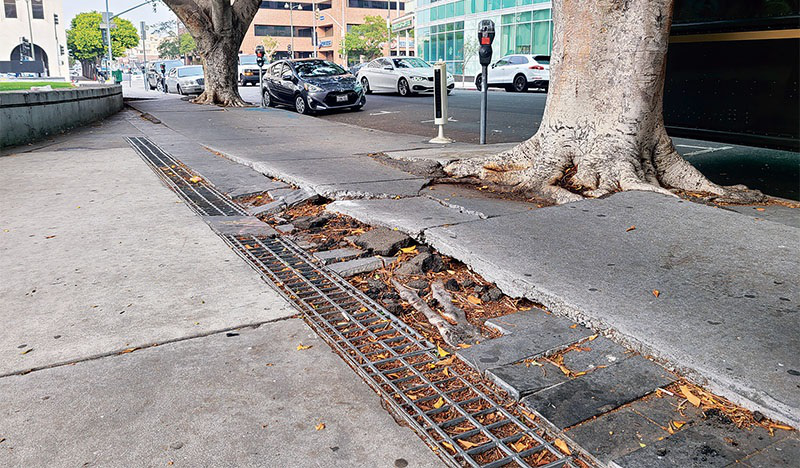

Caption: a tree is growing on the side of a sidewalk
인도 한켠에 나무가 자라고 있다


In [94]:
image41 = Image.open('./test41.jpg')

sample = construct_sample(image41)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image41)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

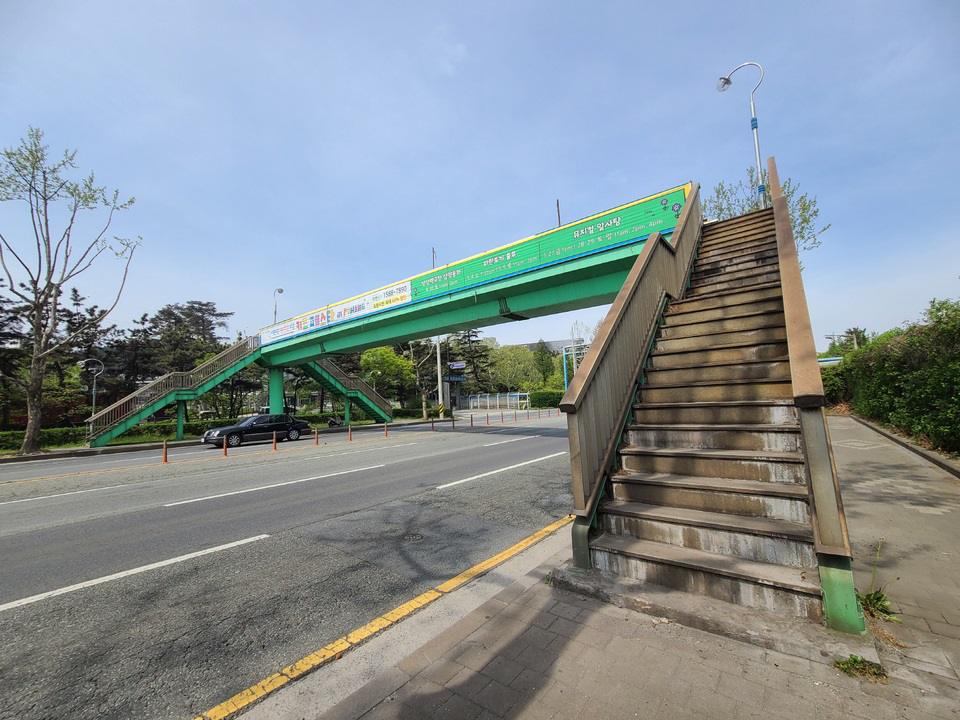

Caption: a green bridge over a road with a set of stairs
계단식 도로 위에 있는 녹색 다리


In [95]:
image42 = Image.open('./test42.jpg')

sample = construct_sample(image42)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image42)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

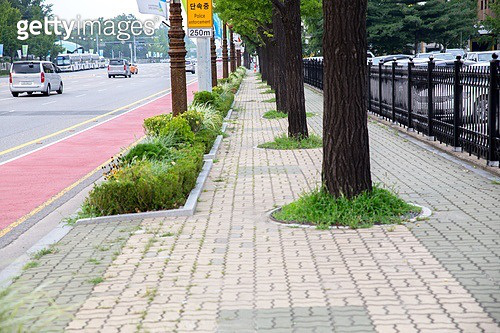

Caption: a sidewalk with trees on the side of a street
가로변에 나무가 있는 보도


In [96]:
image43 = Image.open('./test43.jpg')

sample = construct_sample(image43)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image43)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

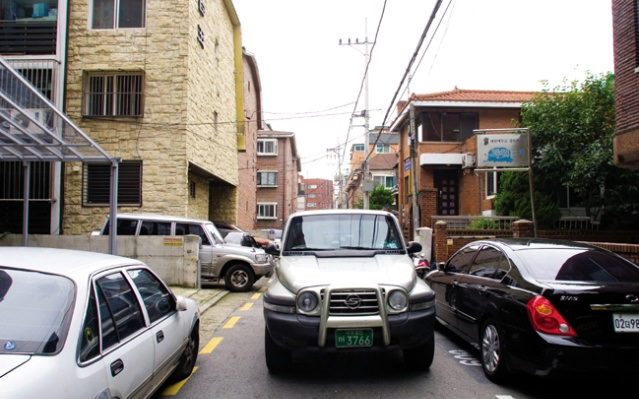

Caption: a white car is parked in a busy street
붐비는 거리에 하얀 차가 주차되어 있다.


In [97]:
image44 = Image.open('./test44.jpg')

sample = construct_sample(image44)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image44)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

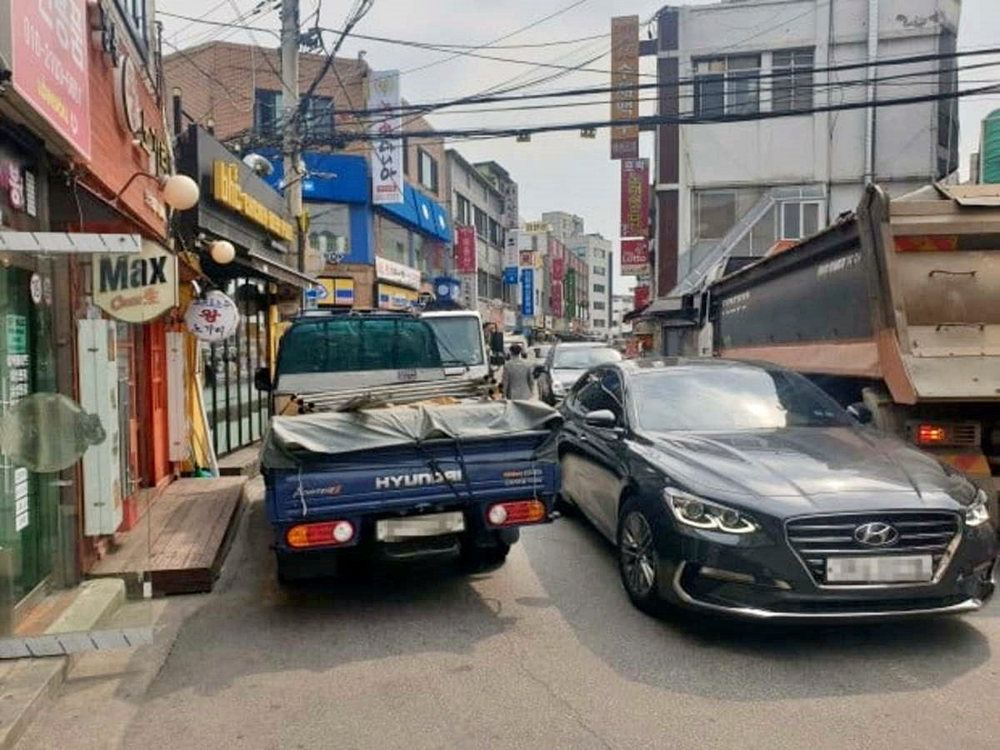

Caption: a truck and a car on a city street
도시 거리의 트럭과 자동차


In [98]:
image45 = Image.open('./test45.jpg')

sample = construct_sample(image45)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image45)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

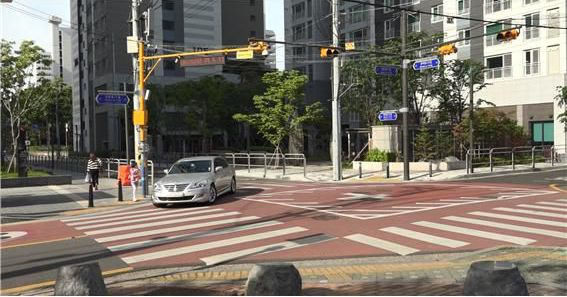

Caption: a silver car driving down a street in a city
도시의 거리를 달리는 은색 자동차


In [99]:
image46 = Image.open('./test46.jpg')

sample = construct_sample(image46)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image46)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

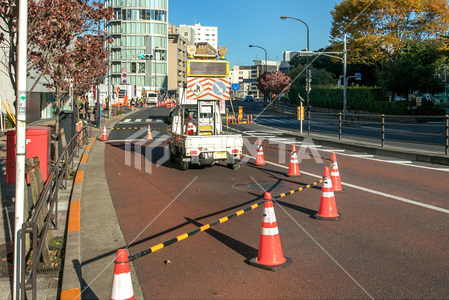

Caption: a construction truck driving down a road with orange cones
오렌지색 원뿔 모양의 도로를 달리는 건설 트럭


In [100]:
image47 = Image.open('./test47.jpg')

sample = construct_sample(image47)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image47)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

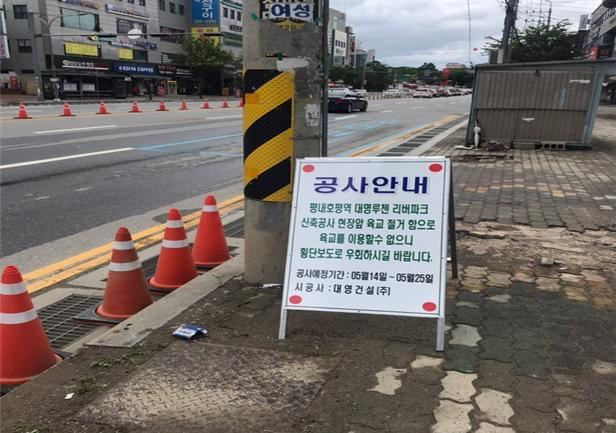

Caption: a sign on the side of a street with traffic cones
도로변에 있는 교통 원뿔 모양의 표지판


In [101]:
image48 = Image.open('./test48.jpg')

sample = construct_sample(image48)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image48)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

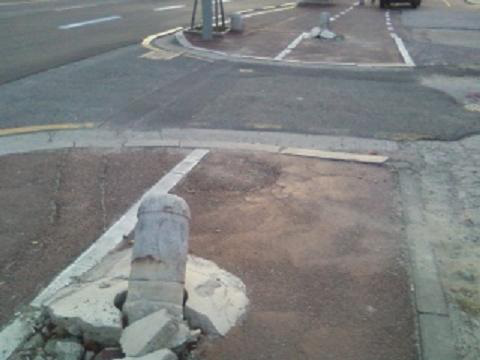

Caption: a street corner with a pole on the side of the road
길가에 장대가 있는 길모퉁이


In [102]:
image49 = Image.open('./test49.jpg')

sample = construct_sample(image49)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image49)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])

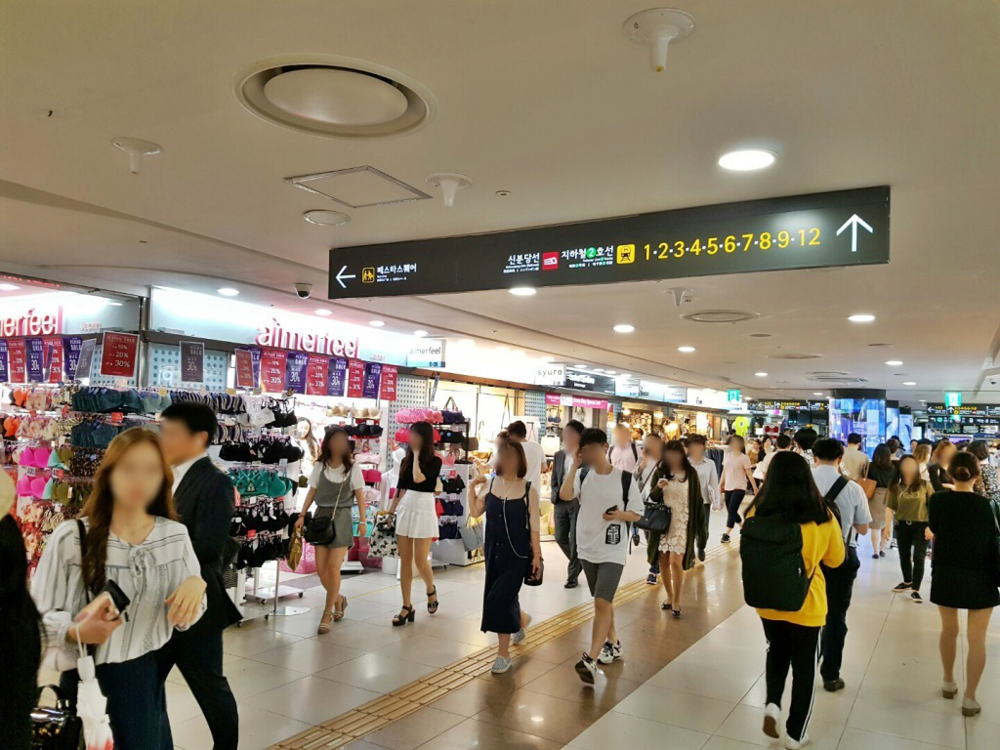

Caption: people walking through a mall in a shopping mall
쇼핑몰에서 쇼핑몰을 걷고 있는 사람들


In [103]:
image52 = Image.open('./test52.jpg')

sample = construct_sample(image52)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

display(image52)
print('Caption: {}'.format(result[0]['caption']))
translate(result[0]['caption'])